# Enrichment Analysis Notebook

Compares the results of SPINDOCTOR gene set summarization vs statistical ontological enrichment.

Draft: https://docs.google.com/document/d/1H103ux6Dd1_bPM0un4RwutBLcYJx-0ybil2AwlAvG_Q/edit#

## Initial setup

Here we take care of imports, defining the data dictionary for the pandas dataframes

In [12]:
# parameters
experiment_results = "../enrichgpt-results/results/enrichment-summary.yaml"

In [13]:
import yaml
from yaml import Loader
from collections import defaultdict
import pandas as pd
from oaklib import get_adapter
from oaklib.datamodels.vocabulary import IS_A, PART_OF
from ontogpt.evaluation.enrichment.eval_enrichment import EvalEnrichment
go = get_adapter("sqlite:obo:go")
hgnc = get_adapter("sqlite:obo:hgnc")

In [ ]:
#from ontogpt.utils.gene_set_utils import populate_ids_and_symbols, GeneSet
#ee = EvalEnrichment()
#ee.ontology = go
#ee.load_annotations("../tests/input/genes2go.tsv.gz")

In [14]:
TURBO = "gpt-3.5-turbo"
DAVINCI = "text-davinci-003"
GPT4 = "gpt-4"
MODELS = [TURBO, DAVINCI, GPT4]

In [15]:
# data dictionary
MODEL = "model"
METHOD = "method"
HAS_TOP_HIT = "has top term"
IN_TOP_5 = "in top 5"
IN_TOP_10 = "in top 10"
RANK = "rank"
SIZE_OVERLAP = "size overlap"
SIMILARITY = "similarity"
NR_SIZE_OVERLAP = "nr size overlap"
NR_SIMILARITY = "nr similarity"
GENESET = "geneset"
PROMPT_VARIANT = "prompt_variant"
SOURCE_GENESET = "source geneset"
GENESET_DESCRIPTION = "description"
GENESET_SIZE = "geneset_size"
TRUNCATION_FACTOR = "truncation factor"
NUM_TERMS = "num terms"
NUM_GO_TERMS = "num GO terms"
NUM_UNPARSED = "num unparsed"
TERM_IDS = "term ids"
GO_TERM_IDS = "go term ids"
GO_TERM_P_VALUES = "go term p values"
MAX_P_VALUE = "max p value"
MIN_P_VALUE = "min p value"
MEAN_P_VALUE = "mean p value"
PROPOTION_SIGNIFICANT = "proportion significant"
NOVEL = "unannotated"
NOVEL_LABELS = "unannotated labels"
NUM_NOVEL = "num unannotated"
GENE_RANDOMIZATION_FACTOR = "gene_randomization_factor"
SUMMARY = "summary"




In [16]:
from ontogpt.evaluation.enrichment.eval_enrichment import GeneSetComparison

In [17]:
# assumes comparisons have been run and concatenated (see Makefile) 
def load_comparisons():
    with open(f"../{experiment_results}") as f:
        obj = yaml.load(f, Loader)
        comps = [GeneSetComparison(**x) for x in obj]
        return comps

In [18]:
comps = load_comparisons()

In [19]:

def filter_redundant(term_ids):
    """
    find leaf nodes in a set of term ids
    """
    cumulative_ancs = set()
    visited = set()
    for t in term_ids:
        visited.add(t)
        if t in cumulative_ancs:
            # a descendant of t has been encountered
            continue
        ancs = list(go.ancestors(t, [IS_A, PART_OF]))
        cumulative_ancs.update(ancs)
        if (visited-{t}).intersection(ancs):
            # t is a descendant of a term that has been encountered
            continue
        yield t

# test
list(filter_redundant(["GO:0005773", "GO:0005634", "GO:0031965", "GO:0008150"]))

['GO:0005773', 'GO:0005634', 'GO:0008150']

In [20]:
import statistics
import re
def eval_payload(comp, payload, expected, closure):
    """
    Create a dataframe row from a payload in a comparison
    """
    expected_nr_ids = list(filter_redundant(expected.term_ids))
    name = comp.name
    model = payload.model
    method = payload.method
    if not model:
        model = "N/A"
    tf = payload.truncation_factor
    if not tf:
        tf = 1.0
    unparsed_term_ids = [t for t in payload.term_ids if not re.match(r'^\S+:w+$', t)]
    go_term_ids = [t for t in payload.term_ids if t.startswith("GO:")]
    nr_term_ids = list(filter_redundant(go_term_ids))
    obj = {MODEL: model, METHOD: method, GENESET: name, TRUNCATION_FACTOR: tf, PROMPT_VARIANT: payload.prompt_variant}
    obj[SUMMARY] = payload.summary
    name_toks = name.split("-")
    obj[SOURCE_GENESET] = "-".join(name_toks[0:-1])
    # obj[GENESET_DESCRIPTION] = comp.
    obj[GENE_RANDOMIZATION_FACTOR] = int(name_toks[-1])
    if not expected.term_ids:
        #print(f"Nothing expected for {name}")
        # top_term_id = "FAKE:123"
        return
    else:
        top_term_id = expected.term_ids[0]
    obj[HAS_TOP_HIT] = top_term_id in payload.term_ids
    in_top_5 = False
    in_top_10 = False
    if top_term_id in payload.term_ids:
        rank = payload.term_ids.index(top_term_id)
        obj[RANK] = rank
        in_top_5 = rank < 5
        in_top_10 = rank < 10
    obj[IN_TOP_5] = in_top_5
    obj[IN_TOP_10] = in_top_10
    overlap = set(go_term_ids).intersection(expected.term_ids)
    obj[SIZE_OVERLAP] = len(overlap)
    nr_overlap = set(nr_term_ids).intersection(expected_nr_ids)
    obj[NR_SIZE_OVERLAP] = len(nr_overlap)
    size_union = len(set(go_term_ids).union(expected.term_ids))
    if size_union:
        obj[SIMILARITY] = len(overlap) / len(set(go_term_ids).union(expected.term_ids))
    nr_size_union = len(set(nr_term_ids).union(expected_nr_ids))
    if nr_size_union:
        obj[NR_SIMILARITY] = len(nr_overlap) / len(set(nr_term_ids).union(expected_nr_ids))
    obj['number_of_terms'] = len(payload.term_ids)
    obj[NUM_GO_TERMS] = len(go_term_ids)
    obj[GENESET_SIZE] = len(comp.gene_symbols)
    obj[TERM_IDS] = payload.term_ids
    obj['term_strings'] = payload.term_strings
    obj[GO_TERM_IDS] = go_term_ids
    obj[NUM_TERMS] = len(payload.term_ids)
    obj[NUM_UNPARSED] = len(unparsed_term_ids)
    p_vals = []
    for t in go_term_ids:
        p_val = 1.0
        for e in expected.enrichment_results:
            if e.class_id == t:
                p_val = e.p_value_adjusted
                break
        p_vals.append(p_val)
    obj[GO_TERM_P_VALUES] = p_vals
    if p_vals:
        obj[MAX_P_VALUE] = max(p_vals)
        obj[MIN_P_VALUE] = min(p_vals)
        obj[MEAN_P_VALUE] = statistics.mean(p_vals)
        obj[PROPOTION_SIGNIFICANT] = len([v for v in p_vals if v<=0.05]) / len(p_vals)
    novel = []
    novel_labels = []
    # enriched_terms = [e.class_id for e in expected.enrichment_results]
    for t in go_term_ids:
        if t not in closure:
            novel.append(t)
            novel_labels.append(go.label(t))
    obj[NOVEL] = novel
    obj[NOVEL_LABELS] = novel_labels
    obj[NUM_NOVEL] = len(novel)
    return obj

objs = []
for comp in comps:
    expected = comp.payloads["standard"]
    closure = comp.payloads["closure"].term_ids
    #gene_set = GeneSet(name=comp.name, gene_symbols=comp.gene_symbols)
    #populate_ids_and_symbols(gene_set, hgnc)
    
    for method, payload in comp.payloads.items():
        obj = eval_payload(comp, payload, expected, closure)
        if obj:
            objs.append(obj)
            # temp
            if not obj[METHOD]:
                obj[METHOD] = method
df = pd.DataFrame(objs)
df.to_csv("enr.csv")
df

,model,method,geneset,truncation factor,prompt_variant,summary,source geneset,gene_randomization_factor,has top term,rank,...,num terms,num unparsed,go term p values,max p value,min p value,mean p value,proportion significant,unannotated,unannotated labels,num unannotated
0,gpt-3.5-turbo,no_synopsis,EDS-0,1.0,v1,Summary: The common function of the genes is r...,EDS,0,True,1.0,...,3,3,"[3.341122685366184e-06, 5.591343976855226e-11,...",0.000321,5.591344e-11,0.000108,1.000000,[],[],0
1,gpt-3.5-turbo,no_synopsis,EDS-0,1.0,v2,Summary: Extracellular matrix organization and...,EDS,0,True,2.0,...,6,6,"[3.341122685366184e-06, 3.4271478353194616e-06...",1.000000,5.591344e-11,0.500001,0.500000,[],[],0
2,gpt-3.5-turbo,ontological_synopsis,EDS-0,1.0,v1,Summary: The enriched terms are related to the...,EDS,0,True,0.0,...,4,4,"[5.591343976855226e-11, 3.341122685366184e-06,...",1.000000,5.591344e-11,0.250081,0.750000,[],[],0
3,gpt-3.5-turbo,ontological_synopsis,EDS-0,1.0,v2,Summary: The common function of the listed gen...,EDS,0,True,0.0,...,5,5,"[5.591343976855226e-11, 1.0, 2.2177237867319e-...",1.000000,5.591344e-11,0.200065,0.800000,[],[],0
4,gpt-3.5-turbo,narrative_synopsis,EDS-0,1.0,v1,Summary: Genes involved in connective tissue d...,EDS,0,False,NaN,...,7,7,"[1.0, 3.341122685366184e-06, 1.0, 1.0, 1.0, 1....",1.000000,3.341123e-06,0.857143,0.142857,"[GO:0010712, GO:0043687]","[regulation of collagen metabolic process, pos...",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2409,N/A,standard,tf-downreg-colorectal-1,1.0,None,None,tf-downreg-colorectal,1,True,0.0,...,180,180,"[2.463439488461684e-28, 2.511460888299925e-28,...",0.047670,2.463439e-28,0.003428,1.000000,[],[],0
2410,N/A,standard_no_ontology,tf-downreg-colorectal-1,1.0,None,None,tf-downreg-colorectal,1,False,NaN,...,40,40,"[1.0670949536417977e-21, 6.368123603602858e-19...",1.000000,6.758362e-27,0.153915,0.850000,[],[],0
2411,N/A,random,tf-downreg-colorectal-1,1.0,None,None,tf-downreg-colorectal,1,False,NaN,...,42,42,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 6.26342211...",1.000000,6.263422e-13,0.952381,0.047619,"[GO:2000095, GO:0006869, GO:0004721, GO:001513...","[regulation of Wnt signaling pathway, planar c...",25
2412,N/A,rank_based,tf-downreg-colorectal-1,1.0,None,None,tf-downreg-colorectal,1,False,NaN,...,46,46,"[4.966218259085737e-14, 1.0, 1.0, 1.0, 1.0, 6....",1.000000,6.758362e-27,0.673924,0.326087,"[GO:0004930, GO:0005509, GO:0007186, GO:000013...","[G protein-coupled receptor activity, calcium ...",5


The above data frame has one row per run of a method

In [21]:
df[[MODEL, METHOD]].drop_duplicates()

,model,method
0,gpt-3.5-turbo,no_synopsis
2,gpt-3.5-turbo,ontological_synopsis
4,gpt-3.5-turbo,narrative_synopsis
6,text-davinci-003,no_synopsis
8,text-davinci-003,ontological_synopsis
10,text-davinci-003,narrative_synopsis
12,N/A,standard
13,N/A,standard_no_ontology
14,N/A,random
15,N/A,rank_based


In [22]:
df[[SOURCE_GENESET]].drop_duplicates()

,source geneset
0,EDS
34,FA
68,HALLMARK_ADIPOGENESIS
102,HALLMARK_ALLOGRAFT_REJECTION
136,HALLMARK_ANDROGEN_RESPONSE
...,...
2244,peroxisome
2278,progeria
2312,regulation of presynaptic membrane potential
2346,sensory ataxia


## TABLE: All gene sets and their sizes

Copy this to [gene set](https://docs.google.com/spreadsheets/d/1gGO5IHEg-N0hivtHBO6-rdXtin8hPhw-zv6eYOBgXcE/edit#gid=1762479413) tab

In [23]:
df[[SOURCE_GENESET, GENESET_SIZE]].drop_duplicates().style.hide_index()

/var/folders/lm/hg0p5znd1hd5yc5lml35j6lh0000gn/T/ipykernel_70726/3852654709.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  df[[SOURCE_GENESET, GENESET_SIZE]].drop_duplicates().style.hide_index()


source geneset,geneset_size
EDS,19
EDS,18
FA,19
FA,18
HALLMARK_ADIPOGENESIS,200
HALLMARK_ADIPOGENESIS,180
HALLMARK_ALLOGRAFT_REJECTION,200
HALLMARK_ALLOGRAFT_REJECTION,180
HALLMARK_ANDROGEN_RESPONSE,101
HALLMARK_ANDROGEN_RESPONSE,90


In [24]:
df[[MODEL, METHOD]].drop_duplicates().style.hide_index()

/var/folders/lm/hg0p5znd1hd5yc5lml35j6lh0000gn/T/ipykernel_70726/2185383538.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  df[[MODEL, METHOD]].drop_duplicates().style.hide_index()


model,method
gpt-3.5-turbo,no_synopsis
gpt-3.5-turbo,ontological_synopsis
gpt-3.5-turbo,narrative_synopsis
text-davinci-003,no_synopsis
text-davinci-003,ontological_synopsis
text-davinci-003,narrative_synopsis
N/A,standard
N/A,standard_no_ontology
N/A,random
N/A,rank_based


In [25]:
df[[MODEL, METHOD, PROMPT_VARIANT]].drop_duplicates().style.hide_index()

/var/folders/lm/hg0p5znd1hd5yc5lml35j6lh0000gn/T/ipykernel_70726/1312593990.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  df[[MODEL, METHOD, PROMPT_VARIANT]].drop_duplicates().style.hide_index()


model,method,prompt_variant
gpt-3.5-turbo,no_synopsis,v1
gpt-3.5-turbo,no_synopsis,v2
gpt-3.5-turbo,ontological_synopsis,v1
gpt-3.5-turbo,ontological_synopsis,v2
gpt-3.5-turbo,narrative_synopsis,v1
gpt-3.5-turbo,narrative_synopsis,v2
text-davinci-003,no_synopsis,v1
text-davinci-003,no_synopsis,v2
text-davinci-003,ontological_synopsis,v1
text-davinci-003,ontological_synopsis,v2


## Subset Analysis

In [26]:

go = get_adapter("sqlite:obo:go")
subsets = list(go.subsets())
subsets_by_term = defaultdict(list)
for subset in subsets:
    members = [m for m in go.subset_members(subset) if m.startswith("GO:")]
    for t in members:
        subsets_by_term[t].append(subset)
    members_ancs = go.ancestors(members)
    anc_subset = f"anc_of_{subset}"
    for a in members_ancs:
        if a not in members:
            subsets_by_term[a].append(anc_subset)

In [27]:
objs = []
for row in df.to_dict(orient="records"):
    for t in row[GO_TERM_IDS]:
        obj = {MODEL: row.get(MODEL), METHOD: row.get(METHOD) , "term": t, "label": go.label(t)}
        for s in subsets_by_term.get(t, []):
            obj[s] = 1
        objs.append(obj)
print(len(objs))
subsets_df=pd.DataFrame(objs) 
pd.set_option('display.max_rows', 10)
subsets_df

756445


,model,method,term,label,goslim_chembl,goslim_generic,goslim_drosophila,goslim_pir,anc_of_goslim_chembl,anc_of_goslim_generic,...,anc_of_goslim_flybase_ribbon,anc_of_goslim_agr,goslim_mouse,anc_of_goslim_plant,anc_of_goslim_pombe,anc_of_gocheck_do_not_manually_annotate,anc_of_goslim_mouse,gocheck_do_not_annotate,gocheck_do_not_manually_annotate,goslim_synapse
0,gpt-3.5-turbo,no_synopsis,GO:0030198,extracellular matrix organization,1.0,1.0,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,gpt-3.5-turbo,no_synopsis,GO:0030199,collagen fibril organization,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,gpt-3.5-turbo,no_synopsis,GO:0006024,glycosaminoglycan biosynthetic process,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,gpt-3.5-turbo,no_synopsis,GO:0030198,extracellular matrix organization,1.0,1.0,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,gpt-3.5-turbo,no_synopsis,GO:0043062,extracellular structure organization,NaN,NaN,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
756440,N/A,closure,GO:0032106,positive regulation of response to extracellul...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
756441,N/A,closure,GO:0032109,positive regulation of response to nutrient le...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
756442,N/A,closure,GO:0045848,positive regulation of nitrogen utilization,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
756443,N/A,closure,GO:2001248,regulation of ammonia assimilation cycle,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### All subsets

In [28]:
subsets_df.fillna(0).groupby([MODEL, METHOD]).mean(numeric_only=True).style.highlight_max(axis=1, props='font-weight:bold').format(precision=3)

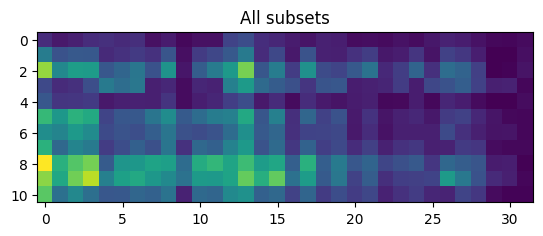

In [30]:
import matplotlib.pyplot as plt

heatdata = subsets_df.fillna(0).groupby([MODEL, METHOD]).mean(numeric_only=True)
plt.imshow( heatdata )
 
plt.title( "All subsets" )
plt.show()

### Core subsets

Copy this to [subsets tab](https://docs.google.com/spreadsheets/d/1gGO5IHEg-N0hivtHBO6-rdXtin8hPhw-zv6eYOBgXcE/edit#gid=669935942)

In [31]:
subsets_cols =  [MODEL, METHOD, "goslim_generic", "anc_of_goslim_generic", "goslim_agr", "anc_of_goslim_agr"]
subsets_grouped = subsets_df.fillna(0).groupby([MODEL, METHOD])[subsets_cols]
means = subsets_grouped.mean(numeric_only=True)
means["closure_of_goslim_generic"] = means["goslim_generic"] + means["anc_of_goslim_generic"]
means["closure_of_goslim_agr"] = means["goslim_agr"] + means["anc_of_goslim_agr"]
means.style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

### TABLE: Above the shoreline in key subsets

[anc subsets tab](https://docs.google.com/spreadsheets/d/1gGO5IHEg-N0hivtHBO6-rdXtin8hPhw-zv6eYOBgXcE/edit#gid=345667144)

In [32]:
sorted_means = means.sort_values("anc_of_goslim_generic", ascending=False)
filtered = sorted_means[["anc_of_goslim_generic", "anc_of_goslim_agr"]]
filtered.style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

In [33]:
means[["anc_of_goslim_generic", "anc_of_goslim_agr"]].sort_values("anc_of_goslim_agr", ascending=True).style.highlight_min(axis=0, props='font-weight:bold').format(precision=3)

In [25]:
# Reset the index of the pivoted DataFrame to have 'profession' as a column
#subsets_df = subsets_df.fillna(0).groupby([MODEL, METHOD])[subsets_cols].mean(numeric_only=True).reset_index()

# Melt the DataFrame to have 'category', 'profession', and 'percentage' columns
#melted_df = subsets_df.melt(id_vars=[MODEL, METHOD], var_name='subset', value_name='proportion')
#melted_df["mm"] = melted_df[MODEL] + melted_df[METHOD]
#melted_df
# Create a bar plot using Seaborn
#plt.figure(figsize=(10, 6))
#sns.barplot(x='subset', y='proportion', hue="mm", data=melted_df)
#plt.title('Subsets by method')
#plt.xlabel('Subset')
#plt.ylabel('Proportion')
#plt.legend(title='Subsets')
#plt.show()

## Evaluation

In [50]:
def agg_table(this_df, cols, exclude=[None]):
    qcols = [MODEL, METHOD] + cols
    agg_df = this_df.replace(r"_", " ", regex=True)[qcols].groupby([MODEL, METHOD]).mean(numeric_only=True)
    for x in exclude:
        agg_df= agg_df.query(f"method != '{x}'")
    return agg_df.style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

pd.options.display.precision = 2
pd.set_option("display.precision", 2)

In [51]:
agg_table(df, [NUM_GO_TERMS, SIZE_OVERLAP, NR_SIZE_OVERLAP], ["standard"])

In [52]:
eval_summary_cols = [HAS_TOP_HIT, IN_TOP_5, IN_TOP_10, SIZE_OVERLAP, SIMILARITY, NUM_TERMS, NUM_GO_TERMS, NR_SIZE_OVERLAP, NR_SIMILARITY, MEAN_P_VALUE, MIN_P_VALUE, MAX_P_VALUE, PROPOTION_SIGNIFICANT, NUM_NOVEL]
agg_table(df, eval_summary_cols)

## TABLE: MAIN RESULTS

In [53]:
CORE_METRICS = [PROPOTION_SIGNIFICANT, HAS_TOP_HIT, NUM_GO_TERMS, NUM_NOVEL, NUM_UNPARSED]
EXCLUDE = ["standard", "standard no ontology", "random", "rank based", "closure"]
agg_table(df, CORE_METRICS, EXCLUDE)
#means.query("method != 'standard'").style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

## as above, no perturbation

In [54]:
df = df.query(f"{GENE_RANDOMIZATION_FACTOR} == 0")
agg_table(df, CORE_METRICS, EXCLUDE)


['model', 'method', 'proportion significant', 'has top term', 'num GO terms', 'num unannotated', 'num unparsed']
MultiIndex([(   'gpt-3.5-turbo',   'narrative synopsis'),
            (   'gpt-3.5-turbo',          'no synopsis'),
            (   'gpt-3.5-turbo', 'ontological synopsis'),
            ('text-davinci-003',   'narrative synopsis'),
            ('text-davinci-003',          'no synopsis'),
            ('text-davinci-003', 'ontological synopsis')],
           names=['model', 'method'])


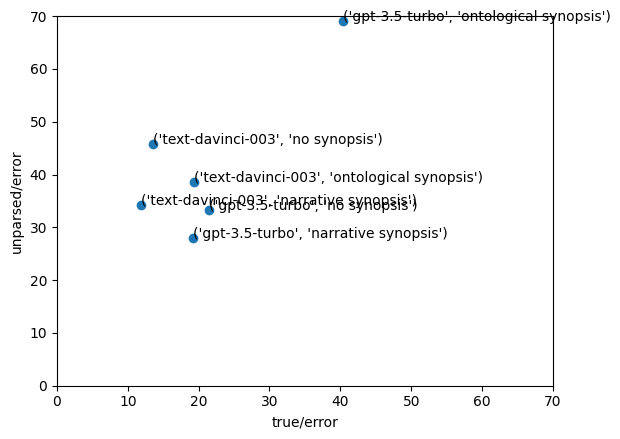

In [80]:
#agg_table = agg_table(df_no_perturb, CORE_METRICS, EXCLUDE)

qcols = [MODEL, METHOD] + CORE_METRICS

print(qcols)
agg_df = df.replace(r"_", " ", regex=True)[qcols].groupby([MODEL, METHOD]).mean(numeric_only=True)
for x in EXCLUDE:
    #print(x)
    agg_df= agg_df.query(f"method != '{x}'")
        
xs = agg_df['num GO terms']/agg_df['num unannotated']
ys = agg_df['num unparsed']/agg_df['num unannotated']
print(agg_df.index)

fig, ax = plt.subplots()

plt.xlim(0,70)
plt.ylim(0,70)
ax.scatter(xs, ys)

for i in range(0,len(xs)):
    ax.annotate(agg_df.index[i], (xs[i], ys[i]))
    
ax.set_xlabel("true/error")
ax.set_ylabel("unparsed/error")

plt.show()

## Maximums

In [32]:
df[[MODEL, METHOD] + eval_summary_cols].groupby([MODEL, METHOD]).max(numeric_only=True).style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

### Effect of truncation

Larger gene sets penalize annotation-based GPT methods due to the necessity to truncate to fit in the window size.



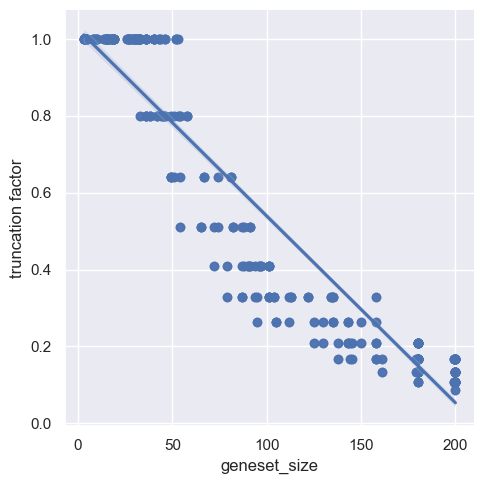

In [33]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
np.random.seed(sum(map(ord, "regression")))
sns.lmplot(x=GENESET_SIZE, y=TRUNCATION_FACTOR, data=df.query("method=='ontological_synopsis'"))
plt.show()

<Axes: xlabel='geneset_size', ylabel='truncation factor'>

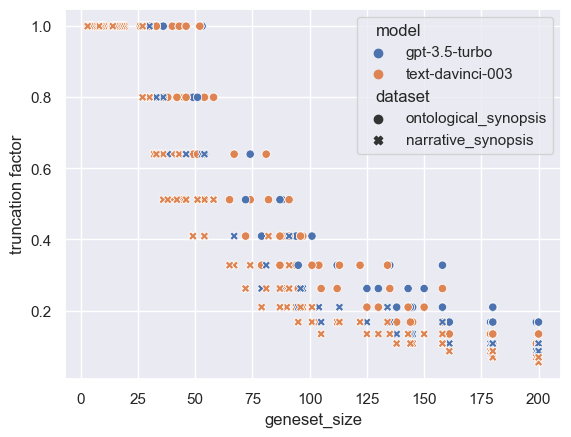

In [34]:
dftups = [(method, df.query(f"method=='{method}'")) for method in ["ontological_synopsis", "narrative_synopsis"]]
for m, mdf in dftups:
    mdf.assign(dataset=m)
concatenated = pd.concat([mdf.assign(dataset=m) for m, mdf in dftups])
sns.scatterplot(x=GENESET_SIZE, y=TRUNCATION_FACTOR, data=concatenated, style='dataset', hue='model')

In [35]:
df.query(f"{GENESET_SIZE} < 50")[[SOURCE_GENESET]].drop_duplicates()

,source geneset
0,EDS
34,FA
170,HALLMARK_ANGIOGENESIS
238,HALLMARK_APICAL_SURFACE
714,HALLMARK_HEDGEHOG_SIGNALING
...,...
2244,peroxisome
2278,progeria
2312,regulation of presynaptic membrane potential
2346,sensory ataxia


In [36]:
df_small = df.query(f"{GENESET_SIZE} < 50")
means = df_small[[MODEL, METHOD] + eval_summary_cols].groupby(['model', 'method']).mean(numeric_only=True)
means

has top term  in top 5  in top 10  \
model            method                                                    
N/A              closure                       1.00      0.04       0.09   
                 random                        0.00      0.00       0.00   
                 rank_based                    0.04      0.04       0.04   
                 standard                      1.00      1.00       1.00   
                 standard_no_ontology          0.63      0.54       0.57   
...                                             ...       ...        ...   
gpt-3.5-turbo    no_synopsis                   0.20      0.18       0.20   
                 ontological_synopsis          0.34      0.34       0.34   
text-davinci-003 narrative_synopsis            0.12      0.12       0.12   
                 no_synopsis                   0.12      0.11       0.12   
                 ontological_synopsis          0.22      0.12       0.17   

                                       size overlap  similarity  num terms  \
model            method                                                      
N/A              closure                     132.61    7.95e-02    2389.76   
                 random                        1.41    7.41e-03      26.07   
                 rank_based                    2.85    1.70e-02      26.72   
                 standard                    132.61    9.83e-01     135.43   
                 standard_no_ontology         28.80    2.14e-01      38.37   
...                                             ...         ...        ...   
gpt-3.5-turbo    no_synopsis                   2.45    2.44e-02       5.27   
                 ontological_synopsis          2.27    3.10e-02       5.35   
text-davinci-003 narrative_synopsis            1.18    1.07e-02      11.34   
                 no_synopsis                   1.00    7.48e-03       7.36   
                 ontological_synopsis          2.51    2.36e-02      12.59   

                                       num GO terms  nr size overlap  \
model            method                                                
N/A              closure                    2346.59             3.41   
                 random                       26.07             0.26   
                 rank_based                   26.72             0.28   
                 standard                    132.61            15.70   
                 standard_no_ontology         38.37             5.63   
...                                             ...              ...   
gpt-3.5-turbo    no_synopsis                   4.33             0.71   
                 ontological_synopsis          3.90             0.77   
text-davinci-003 narrative_synopsis            3.35             0.35   
                 no_synopsis                   2.62             0.28   
                 ontological_synopsis          7.91             0.52   

                                       nr similarity  mean p value  \
model            method                                              
N/A              closure                    2.27e-02      9.15e-01   
                 random                     6.58e-03      9.54e-01   
                 rank_based                 8.75e-03      9.11e-01   
                 standard                   9.78e-01      8.28e-03   
                 standard_no_ontology       1.92e-01      2.96e-01   
...                                              ...           ...   
gpt-3.5-turbo    no_synopsis                4.12e-02      4.27e-01   
                 ontological_synopsis       5.47e-02      3.90e-01   
text-davinci-003 narrative_synopsis         1.97e-02      6.75e-01   
                 no_synopsis                1.57e-02      5.95e-01   
                 ontological_synopsis       2.67e-02      6.63e-01   

                                       min p value  max p value  \
model            method                                           
N/A              closure                  2.59e-04   

In [37]:
means.query("method != 'standard'").style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

## TABLE: evaluation for gene sets < 75

In [39]:
agg_table(df_small, CORE_METRICS, EXCLUDE)

## Looking at individual gene sets

In [35]:

def terms_summary(df, variant="v1", max_rows=9999):
    term_dict = {}
    n = 0
    for _, row in df.iterrows():
        if row[PROMPT_VARIANT] and row[PROMPT_VARIANT] != variant:
            continue
        n += 1
        if n > max_rows:
            break
        model = row['model'] 
        if "turbo" in model:
            model = "turbo"
        elif "davinci" in model:
            model = "dav"
        else:
            model = ""
        method = str(row['method']).replace('_', ' ')
        if method in ["closure", "rank_based", "random"]:
            continue
        mm = f"{model} {method}"
        if method == "standard":
            nr_term_ids = list(filter_redundant(row[TERM_IDS]))
        else:
            nr_term_ids = None
        for ix, t_id in enumerate(row[TERM_IDS]):
            if t_id not in term_dict:
                t = {"id": t_id, "label": go.label(t_id), "redundant": False}
                term_dict[t_id] = t
            else:
                t = term_dict[t_id]
            t[mm] = ix
            if nr_term_ids and t_id not in nr_term_ids:
                t["redundant"] = True
    objs = list(term_dict.values())
    return pd.DataFrame(objs)

In [36]:
import oaklib.datamodels.obograph as og
from oaklib.utilities.obograph_utils import graph_to_image, default_stylemap_path
!mkdir -p output

MMAP = {"standard": None, 
        "gpt-3.5-turbo.no_synopsis": "NS",
        "gpt-3.5-turbo.ontological_synopsis": "ONT",
        "gpt-3.5-turbo.narrative_synopsis": "NAR",
       }

def viz(geneset, include_std=True, mmap = MMAP, variant="v1"):
    methods = mmap.keys()
    [gsobj] = [c for c in comps if c.name == geneset]
    std = gsobj.payloads["standard"]
    t2p = {e.class_id : e.p_value_adjusted for e in std.enrichment_results}
    terms = set()
    terms.add("GO:0008150")
    terms.add("GO:0003674")
    terms.add("GO:0005575")
    m2t = defaultdict(list)
    t2m = defaultdict(set)
    seeds = []
    for m in methods:
        if m == "standard":
            mv = m
        else:
            mv = f"{m}.{variant}"
        p = gsobj.payloads[mv]
        if include_std or m != "standard":
            terms.update(p.term_ids)
        for t in p.term_ids:
            if t.startswith("MONDO:"):
                continue
            m2t[m].append(t)
            t2m[t].add(m)
            if m == "standard":
                seeds.append(t)
    # rels = go.gap_fill_relationships(list(terms), predicates=[IS_A, PART_OF, "RO:0002211", "RO:0002212", RO:0002213"])
    rels = go.gap_fill_relationships(list(terms), predicates=[IS_A, PART_OF])
    g = go.relationships_to_graph(rels)
    for n in g.nodes:
        if not n.lbl:
            n.lbl = go.label(n.id)
        if not n.lbl:
            n.lbl = n.id
        if n.id in t2p:
            n.lbl += f" {t2p[n.id]:.2e}"
        #for m in t2m[n.id]:
        #    n.lbl += f" [<b>{m}</b>]"
    for m in m2t.keys():
        if m == "standard":
            continue
        for t in m2t[m]:
            n = og.Node(id=f"{mmap[m]}:{t}", lbl=mmap[m])
            g.nodes.append(n)
            g.edges.append(og.Edge(n.id, "has", t))
    outfile = f"output/{geneset.replace(' ', '_')}-{include_std}-{variant}.png"
    graph_to_image(g, seeds=seeds, imgfile=outfile, stylemap="input/enr-style.json")
    graph_to_image(g, seeds=seeds, imgfile=outfile, stylemap="input/enr-style.json")
    #return g
    
viz('peroxisome-0')
viz('peroxisome-0', variant="v2")

In [37]:
def geneset_summary(df, geneset):
    sdf = terms_summary(df.query(f"{GENESET} == '{geneset}'").sort_values("similarity", ascending=False))
    [gsobj] = [c for c in comps if c.name == geneset]
    std = gsobj.payloads["standard"]
    t2p = {e.class_id : e.p_value_adjusted for e in std.enrichment_results}
    sdf["p_label"] = sdf.apply(lambda row: str(row.label) + " " + str(t2p.get(row.id, "")), axis=1)
    return sdf

geneset_summary(df, 'peroxisome-0')

,id,label,redundant,standard,standard no ontology,turbo no synopsis,turbo narrative synopsis,dav ontological synopsis,turbo ontological synopsis,dav no synopsis,dav narrative synopsis,rank based,p_label
0,GO:0006625,protein targeting to peroxisome,False,0.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,protein targeting to peroxisome 1.983967326142...
1,GO:0072663,establishment of protein localization to perox...,True,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,establishment of protein localization to perox...
2,GO:0072662,protein localization to peroxisome,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,protein localization to peroxisome 1.983967326...
3,GO:0015919,peroxisomal membrane transport,False,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,peroxisomal membrane transport 3.8191371028307...
4,GO:0043574,peroxisomal transport,True,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,peroxisomal transport 6.889423793379416e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,GO:0016020,membrane,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,membrane
93,GO:0005829,cytosol,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,cytosol
94,GO:0005634,nucleus,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,nucleus
95,GO:0005654,nucleoplasm,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,nucleoplasm


### Peroxisome

In [38]:
peroxisome = df.query(f"{GENESET} == 'peroxisome-0'").sort_values("similarity", ascending=False)
peroxisome[[MODEL, METHOD] + eval_summary_cols]

,model,method,has top term,in top 5,in top 10,size overlap,similarity,num terms,num GO terms,nr size overlap,nr similarity,mean p value,min p value,max p value,proportion significant,num unannotated
2256,N/A,standard,True,True,True,62,1.00,62,62,10,1.00,5.64e-03,1.98e-16,0.04,1.00,0
2257,N/A,standard_no_ontology,True,False,False,15,0.22,21,21,7,0.41,2.89e-01,1.98e-16,1.00,0.71,0
2260,N/A,closure,True,True,True,62,0.19,419,391,7,0.14,8.02e-01,1.98e-16,1.00,0.20,0
2252,text-davinci-003,ontological_synopsis,False,False,False,5,0.08,10,6,4,0.33,1.73e-01,2.87e-04,1.00,0.83,0
2253,text-davinci-003,ontological_synopsis,True,False,True,4,0.06,10,6,2,0.15,3.33e-01,1.98e-16,1.00,0.67,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2254,text-davinci-003,narrative_synopsis,False,False,False,0,0.00,8,0,0,0.00,NaN,NaN,NaN,NaN,0
2255,text-davinci-003,narrative_synopsis,False,False,False,0,0.00,3,0,0,0.00,NaN,NaN,NaN,NaN,0
2247,gpt-3.5-turbo,ontological_synopsis,False,False,False,0,0.00,3,1,0,0.00,1.00e+00,1.00e+00,1.00,0.00,1
2258,N/A,random,False,False,False,0,0.00,8,8,0,0.00,1.00e+00,1.00e+00,1.00,0.00,7


In [39]:
# terms_summary(peroxisome).style.highlight_min(axis=1, props='font-weight:bold', numeric_only=True)
terms_summary(peroxisome)

,id,label,redundant,standard,standard no ontology,turbo no synopsis,turbo narrative synopsis,dav ontological synopsis,turbo ontological synopsis,dav no synopsis,dav narrative synopsis,rank based
0,GO:0006625,protein targeting to peroxisome,False,0.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0072663,establishment of protein localization to perox...,True,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GO:0072662,protein localization to peroxisome,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GO:0015919,peroxisomal membrane transport,False,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GO:0043574,peroxisomal transport,True,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
92,GO:0016020,membrane,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
93,GO:0005829,cytosol,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
94,GO:0005634,nucleus,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
95,GO:0005654,nucleoplasm,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0


In [40]:
terms_summary(peroxisome, "v2")

,id,label,redundant,standard,standard no ontology,dav ontological synopsis,turbo no synopsis,turbo narrative synopsis,dav no synopsis,dav narrative synopsis,turbo ontological synopsis,rank based
0,GO:0006625,protein targeting to peroxisome,False,0.0,10.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0072663,establishment of protein localization to perox...,True,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GO:0072662,protein localization to peroxisome,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GO:0015919,peroxisomal membrane transport,False,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GO:0043574,peroxisomal transport,True,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
95,GO:0016020,membrane,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
96,GO:0005829,cytosol,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
97,GO:0005634,nucleus,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
98,GO:0005654,nucleoplasm,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0


## Sensory Ataxia

In [41]:
ataxia = df.query(f"{GENESET} == 'sensory ataxia-0'").sort_values("similarity", ascending=False)
ataxia[[MODEL, METHOD] + eval_summary_cols]                                                  

,model,method,has top term,in top 5,in top 10,size overlap,similarity,num terms,num GO terms,nr size overlap,nr similarity,mean p value,min p value,max p value,proportion significant,num unannotated
2358,N/A,standard,True,True,True,9,1.00,9,9,3,1.00,0.01,1.95e-05,0.04,1.00,0
2359,N/A,standard_no_ontology,False,False,False,3,0.30,4,4,1,0.20,0.26,3.13e-04,1.00,0.75,0
2348,gpt-3.5-turbo,ontological_synopsis,True,True,True,2,0.20,5,3,2,0.67,0.33,1.95e-05,1.00,0.67,0
2349,gpt-3.5-turbo,ontological_synopsis,True,True,True,2,0.18,7,4,2,0.40,0.50,1.95e-05,1.00,0.50,0
2351,gpt-3.5-turbo,narrative_synopsis,False,False,False,1,0.11,5,1,1,0.33,0.03,2.80e-02,0.03,1.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357,text-davinci-003,narrative_synopsis,False,False,False,0,0.00,11,4,0,0.00,1.00,1.00e+00,1.00,0.00,1
2356,text-davinci-003,narrative_synopsis,False,False,False,0,0.00,8,2,0,0.00,1.00,1.00e+00,1.00,0.00,0
2353,text-davinci-003,no_synopsis,False,False,False,0,0.00,5,3,0,0.00,1.00,1.00e+00,1.00,0.00,1
2352,text-davinci-003,no_synopsis,False,False,False,0,0.00,5,3,0,0.00,1.00,1.00e+00,1.00,0.00,0


In [42]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)


In [43]:
ataxia[[MODEL, METHOD, PROMPT_VARIANT, GO_TERM_IDS, NOVEL_LABELS]]

,model,method,prompt_variant,go term ids,unannotated labels
2358,N/A,standard,None,"[GO:0042552, GO:0008366, GO:0007272, GO:0007422, GO:0014037, GO:0010001, GO:0032287, GO:0006264, GO:0042063]",[]
2359,N/A,standard_no_ontology,None,"[GO:0021680, GO:0032287, GO:0006264, GO:0007422]",[]
2348,gpt-3.5-turbo,ontological_synopsis,v1,"[GO:0042552, GO:0007422, GO:0022011]",[]
2349,gpt-3.5-turbo,ontological_synopsis,v2,"[GO:0042552, GO:0007422, GO:0006457, GO:0007600]",[]
2351,gpt-3.5-turbo,narrative_synopsis,v2,[GO:0006264],[]
2350,gpt-3.5-turbo,narrative_synopsis,v1,"[GO:0043209, GO:0006264]",[]
2347,gpt-3.5-turbo,no_synopsis,v2,"[GO:0042552, GO:0007411, GO:0007399, GO:0008104, GO:0031175]",[]
2355,text-davinci-003,ontological_synopsis,v2,"[GO:0031625, GO:0003677, GO:0006027, GO:0043583, GO:0045475, GO:0007399, GO:0006457, GO:0043066, GO:0010595, GO:0002639, GO:0034214, GO:0050974, GO:0006812, GO:0015886, GO:0071260, GO:0042552, GO:0098742, GO:0006839, GO:0019226, GO:0008380, GO:0003774, GO:0061608, GO:0006607, GO:0003887, GO:0006284]","[glycosaminoglycan catabolic process, transmission of nerve impulse, RNA splicing, cytoskeletal motor activity]"
2362,N/A,closure,None,"[GO:0005654, GO:0140018, GO:0008381, GO:0032060, GO:0009611, GO:0006915, GO:0043484, GO:0006400, GO:0046620, GO:0035994, GO:0071310, GO:0043139, GO:0048168, GO:0055085, GO:0005760, GO:0032963, GO:0042982, GO:0030278, GO:0043218, GO:0000981, GO:0061608, GO:0032570, GO:0032868, GO:0034975, GO:0048536, GO:0006959, GO:0000976, GO:0008270, GO:0003158, GO:0034101, GO:0009612, GO:0060173, GO:0042391, GO:0033157, GO:0021675, GO:0004860, GO:0042564, GO:0099022, GO:0006611, GO:0043565, GO:0002020, GO:0006094, GO:0045182, GO:0046872, GO:0005576, GO:0007165, GO:0035264, GO:0010595, GO:0016597, GO:0014037, GO:0032496, GO:0032355, GO:0002161, GO:0006914, GO:0007399, GO:0034142, GO:0106074, GO:1904390, GO:0050885, GO:0043154, GO:0002639, GO:0006096, GO:0006259, GO:0098743, GO:0035284, GO:0007611, GO:0006390, GO:0035640, GO:0014040, GO:0033574, GO:0006801, GO:0071260, GO:0031069, GO:0006287, GO:0007268, GO:0001701, GO:0007040, GO:0005739, GO:0035578, GO:0006419, GO:0005759, GO:0035633, GO:0034774, GO:0097577, GO:0046548, GO:0005783, GO:0001707, GO:0031625, GO:0051787, GO:0005125, GO:0051607, GO:0004561, GO:0030201, GO:0003697, GO:0008366, GO:0008033, GO:0008408, GO:0005643, GO:0003700, GO:0006812, ...]",[]
2361,N/A,rank_based,None,"[GO:0005654, GO:0006357, GO:0070062, GO:0042802, GO:0016020, GO:0046872, GO:0005576, GO:0005737, GO:0005829, GO:0005634, GO:0005739, GO:0005615, GO:0005524, GO:0005886, GO:0003723]",[]


In [44]:
viz('sensory ataxia-0')

![img](output/sensory_ataxia-0-True-v1.png)

In [45]:
viz('sensory ataxia-0', variant="v2")

![img](output/sensory_ataxia-0-True-v2.png)

In [46]:
terms_summary(ataxia)

,id,label,redundant,standard,turbo ontological synopsis,standard no ontology,turbo narrative synopsis,rank based,dav ontological synopsis,turbo no synopsis,dav narrative synopsis,dav no synopsis
0,GO:0042552,myelination,False,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0008366,axon ensheathment,True,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GO:0007272,ensheathment of neurons,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GO:0007422,peripheral nervous system development,False,3.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN
4,GO:0014037,Schwann cell differentiation,True,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GO:0010001,glial cell differentiation,True,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,GO:0032287,peripheral nervous system myelin maintenance,True,6.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0006264,mitochondrial DNA replication,False,7.0,NaN,2.0,4.0,NaN,NaN,NaN,NaN,NaN
8,GO:0042063,gliogenesis,True,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0021680,cerebellar Purkinje cell layer development,False,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
def retrieve_payload(geneset, method):
    for comp in comps:
        if comp.name == geneset:
            return comp.payloads[method]

In [48]:
print(retrieve_payload("sensory ataxia-0", "gpt-3.5-turbo.ontological_synopsis.v1").response_text)

Summary: Genes are primarily involved in the peripheral nervous system, myelination, and neurological disorders.
Mechanism: The enriched terms suggest that these genes primarily function in the peripheral nervous system and myelination.
Enriched Terms:  myelination; peripheral nervous system development; neurological disorder; peripheral nervous system myelination; and neuropathy. 
Hypothesis: These genes are all involved in the development and maintenance of the peripheral nervous system and myelination. Dysregulation or mutation of these genes likely leads to neuropathic disorders.


In [49]:
print(retrieve_payload("sensory ataxia-0", "gpt-3.5-turbo.narrative_synopsis.v1").response_text)

Summary: Myelin upkeep and neurological diseases
Enriched Terms: Charcot-Marie-Tooth disease; peripheral neuropathy; Dejerine-Sottas syndrome; myelin sheath; mitochondrial DNA replication; tetratricopeptide repeat; transporter protein

Mechanism: These genes are involved in myelin upkeep and various neurological diseases associated with defects in myelin sheath synthesis and functions. They play roles in mitochondrial DNA replication and transport, as well as protein transportation across the nuclear membrane. The presence of tetratricopeptide repeat motifs in these genes suggests their roles in protein-protein interactions and chaperone functions.

Hypothesis: Dysregulation of the myelin upkeep pathways can lead to mitochondrial dysfunction, accumulations of toxic metabolites, and impaired protein processing, which contribute to the development of neurological diseases. Dysfunction of the transporter proteins and nuclear membrane transporters can further exacerbate cell dysfunction an

In [50]:
print(retrieve_payload("sensory ataxia-0", "gpt-3.5-turbo.no_synopsis.v1").response_text)

Summary: The enriched terms found among the listed human genes suggest a common involvement in cellular metabolism, particularly in mitochondrial function, protein folding and degradation, and transportation across cellular membranes.
Mechanism: These genes may be involved in the maintenance of cellular homeostasis and energy production.
Enriched Terms: Mitochondrial function; Protein folding; Protein degradation; Membrane transport. 

Hypothesis: Many of the enriched terms are related to cellular stress pathways, suggesting that these genes may be involved in the response to stress and cellular damage. Additionally, the involvement of several genes related to mitochondrial function suggests that there may be a common underlying mechanism related to energy production and metabolism.


## T cell proliferation

In [51]:
tcp = df.query(f"{GENESET} == 'T cell proliferation-0'").sort_values("similarity", ascending=False)
tcp[[MODEL, METHOD] + eval_summary_cols]

,model,method,has top term,in top 5,in top 10,size overlap,similarity,num terms,num GO terms,nr size overlap,nr similarity,mean p value,min p value,max p value,proportion significant,num unannotated
1746,N/A,standard,True,True,True,491,1.00e+00,491,491,15,1.00e+00,2.96e-03,2.66e-193,4.96e-02,1.00,0
1747,N/A,standard_no_ontology,True,True,True,79,1.56e-01,95,95,3,4.62e-02,1.71e-01,2.66e-193,1.00e+00,0.83,0
1750,N/A,closure,True,False,False,491,1.11e-01,6315,6255,1,1.47e-03,8.93e-01,2.66e-193,1.00e+00,0.11,0
1749,N/A,rank_based,False,False,False,15,2.74e-02,72,72,1,2.63e-02,7.92e-01,3.40e-19,1.00e+00,0.21,4
1736,gpt-3.5-turbo,ontological_synopsis,False,False,False,5,1.02e-02,8,5,0,0.00e+00,1.08e-02,1.22e-28,4.94e-02,1.00,0
1735,gpt-3.5-turbo,no_synopsis,False,False,False,5,1.02e-02,6,6,0,0.00e+00,1.67e-01,4.13e-126,1.00e+00,0.83,0
1748,N/A,random,False,False,False,4,7.22e-03,67,67,0,0.00e+00,9.41e-01,1.18e-03,1.00e+00,0.06,29
1741,text-davinci-003,no_synopsis,False,False,False,3,6.11e-03,5,3,0,0.00e+00,9.86e-04,1.59e-14,2.96e-03,1.00,0
1738,gpt-3.5-turbo,narrative_synopsis,False,False,False,3,6.10e-03,5,4,0,0.00e+00,2.50e-01,1.50e-18,1.00e+00,0.75,0
1740,text-davinci-003,no_synopsis,False,False,False,3,6.07e-03,10,6,0,0.00e+00,5.00e-01,1.50e-18,1.00e+00,0.50,0


In [52]:
viz('T cell proliferation-0')

![img](output/T_cell_proliferation-0-True.png)

In [ ]:
terms_summary(tcp)

## Endocytosis

In [54]:
endocytosis = df.query(f"{GENESET} == 'endocytosis-0'").sort_values("similarity", ascending=False)
terms_summary(endocytosis)

,id,label,redundant,standard,standard no ontology,turbo ontological synopsis,dav narrative synopsis,dav ontological synopsis,turbo no synopsis,turbo narrative synopsis,dav no synopsis,rank based
0,GO:0006907,pinocytosis,False,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0006897,endocytosis,True,1.0,6.0,0.0,0.0,5.0,0.0,0.0,NaN,NaN
2,GO:0044351,macropinocytosis,True,2.0,0.0,NaN,4.0,NaN,NaN,NaN,NaN,NaN
3,GO:0016192,vesicle-mediated transport,True,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
4,GO:0030100,regulation of endocytosis,False,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GO:0006810,transport,True,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,GO:0051234,establishment of localization,True,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0045807,positive regulation of endocytosis,True,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,GO:0060627,regulation of vesicle-mediated transport,True,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0051179,localization,True,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
print(retrieve_payload("endocytosis-0", "gpt-3.5-turbo.narrative_synopsis").prompt)

KeyError: 'gpt-3.5-turbo.narrative_synopsis'

In [ ]:
print(retrieve_payload("endocytosis-0", "gpt-3.5-turbo.narrative_synopsis").response_text)

In [ ]:
print(retrieve_payload("endocytosis-0", "gpt-3.5-turbo.ontological_synopsis").prompt)

## Hydrolysis

In [56]:
hydrolysis = df.query(f"{GENESET} == 'hydrolase activity, hydrolyzing O-glycosyl compounds-0'").sort_values("similarity", ascending=False)
terms_summary(hydrolysis)

,id,label,redundant,standard,standard no ontology,dav ontological synopsis,dav narrative synopsis,turbo narrative synopsis,turbo no synopsis,turbo ontological synopsis,rank based,dav no synopsis
0,GO:0004553,"hydrolase activity, hydrolyzing O-glycosyl compounds",False,0.0,62.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0016798,"hydrolase activity, acting on glycosyl bonds",True,1.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,GO:0005975,carbohydrate metabolic process,False,2.0,0.0,NaN,NaN,2.0,1.0,NaN,NaN,NaN
3,GO:0016787,hydrolase activity,True,3.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
4,GO:1901136,carbohydrate derivative catabolic process,False,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GO:0009311,oligosaccharide metabolic process,True,5.0,22.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN
6,GO:1901135,carbohydrate derivative metabolic process,True,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0003824,catalytic activity,True,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,GO:0006026,aminoglycan catabolic process,True,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0009313,oligosaccharide catabolic process,True,9.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
viz('hydrolase activity, hydrolyzing O-glycosyl compounds-0')

## Variability

In [58]:
pv_pivot = df.pivot_table(index=[MODEL, METHOD, GENESET], columns=PROMPT_VARIANT, values=PROPOTION_SIGNIFICANT)
# Calculate differences between run "1" and run "2"
pv_pivot['diff'] = pv_pivot["v1"] - pv_pivot["v2"]
pv_pivot

prompt_variant                                                                                  v1  \
model            method               geneset                                                        
gpt-3.5-turbo    narrative_synopsis   EDS-0                                                   0.14   
                                      EDS-1                                                   0.50   
                                      FA-0                                                    1.00   
                                      FA-1                                                    1.00   
                                      HALLMARK_ADIPOGENESIS-0                                 1.00   
                                      HALLMARK_ADIPOGENESIS-1                                 0.33   
                                      HALLMARK_ALLOGRAFT_REJECTION-0                          1.00   
                                      HALLMARK_ALLOGRAFT_REJECTION-1                          1.00   
                                      HALLMARK_ANDROGEN_RESPONSE-0                            0.00   
                                      HALLMARK_ANDROGEN_RESPONSE-1                            0.20   
                                      HALLMARK_ANGIOGENESIS-0                                 0.50   
                                      HALLMARK_ANGIOGENESIS-1                                 0.50   
                                      HALLMARK_APICAL_JUNCTION-0                              1.00   
                                      HALLMARK_APICAL_JUNCTION-1                              0.80   
                                      HALLMARK_APICAL_SURFACE-0                               0.25   
                                      HALLMARK_APICAL_SURFACE-1                               0.33   
                                      HALLMARK_APOPTOSIS-0                                    1.00   
                                      HALLMARK_APOPTOSIS-1                                     NaN   
                                      HALLMARK_BILE_ACID_METABOLISM-0                         1.00   
                                      HALLMARK_BILE_ACID_METABOLISM-1                         0.83   
                                      HALLMARK_CHOLESTEROL_HOMEOSTASIS-0                      0.67   
                                      HALLMARK_CHOLESTEROL_HOMEOSTASIS-1                      0.67   
                                      HALLMARK_COAGULATION-0                                  1.00   
                                      HALLMARK_COAGULATION-1                                  0.50   
                                      HALLMARK_COMPLEMENT-0                                   1.00   
                                      HALLMARK_COMPLEMENT-1                                   0.80   
                                      HALLMARK_DNA_REPAIR-0                                   0.67   
                                      HALLMARK_DNA_REPAIR-1                                   0.38   
                                      HALLMARK_E2F_TARGETS-0                                  1.00   
                                      HALLMARK_E2F_TARGETS-1                                  0.75   
                                      HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION-0            1.00   
                                      HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION-1            0.83   
                                      HALLMARK_ESTROGEN_RESPONSE_EARLY-0                      0.00   
                                      HALLMARK_ESTROGEN_RESPONSE_EARLY-1                      0.00   
                                      HALLMARK_ESTROGEN_RESPONSE_LATE-0                       0.00   
                                      HALLMARK_ESTROGEN_RESPONSE_LATE-1                       0.20   
                                      HALLMARK_FATTY_ACID_METABOLISM-0                        0.80   
                      

In [59]:

# Now you can perform statistics on the 'diff' column
df_diff_stats = pv_pivot['diff'].agg(['mean', 'std', 'var', 'min', 'max'])
df_diff_stats['range'] = df_diff_stats['max'] - df_diff_stats['min']
df_diff_stats

mean     3.45e-04
std      3.26e-01
var      1.06e-01
min     -1.00e+00
max      1.00e+00
range    2.00e+00
Name: diff, dtype: float64

In [60]:
def jaccard_similarity(list1, list2):
    intersection = len(list(set(list1).intersection(list2)))
    union = (len(list1) + len(list2)) - intersection
    return float(intersection) / union

# pivot your dataframe as before
df_pivot = df.pivot_table(index=[MODEL, METHOD, GENESET], columns=PROMPT_VARIANT, values=TERM_IDS, aggfunc=list)
df_pivot

prompt_variant                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      v1  \
model            method               geneset                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
gpt-3.5-turbo    narrative_synopsis   EDS-0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [61]:

# calculate Jaccard index for each group
df_pivot['jaccard_index'] = df_pivot.apply(lambda row: jaccard_similarity(row["v1"][0], row["v2"][0]), axis=1)

# reset index to get it back in the form of a DataFrame
result = df_pivot.reset_index()
result

prompt_variant,model,method,geneset,v1,v2,jaccard_index
0,gpt-3.5-turbo,narrative_synopsis,EDS-0,"[[GO:0032964, GO:0030198, GO:0010712, GO:0043687, GO:0006493, GO:0006508, GO:0008270]]","[[GO:0032964, matrix maturation, GO:0031012, MESH:D006023, MESH:D015238, zinc finger proteins, proteolytic subunits, MESH:D057057, MESH:M0465019]]",0.07
1,gpt-3.5-turbo,narrative_synopsis,EDS-1,"[[GO:0032964, GO:0061448, GO:0030198, GO:0030166]]","[[GO:0032964, GO:0030198, GO:0006457, GO:0006955]]",0.33
2,gpt-3.5-turbo,narrative_synopsis,FA-0,"[[GO:0006281, GO:0035825, GO:0006302, chromosome stability \n\nhypotheses: the enriched terms suggest that the common function of these genes is dna repair, specifically in the context of homologous recombination and double-strand break repair. the genes are part of a complex network involved in maintaining chromosome stability, which is critical for preventing mutations and malignant transformation. mutations in these genes have been linked to various forms of cancer and the fanconi anemia disorder. understanding the mechanisms by which these genes function in dna repair could provide insights into cancer development and potential therapeutic targets]]","[[GO:0006281, GO:0035825, fanconi anemia pathway]]",0.40
3,gpt-3.5-turbo,narrative_synopsis,FA-1,"[[GO:0006281, fanconi anemia pathway, GO:0035825, MESH:M0443452, genome maintenance, GO:0006302]]","[[GO:0006281, GO:0035825, MESH:D051856, rad51 family proteins, chromosome stability maintenance\n\nmechanism: these genes are involved in dna damage repair and maintenance of genome stability, particularly through homologous recombination and the formation of the fanconi anemia complementation group proteins. the rad51 family proteins and chromosomal stability maintenance are also important in these processes]]",0.22
4,gpt-3.5-turbo,narrative_synopsis,HALLMARK_ADIPOGENESIS-0,"[[GO:0005739, GO:0006119, GO:0022900, GO:0006091, MESH:M0496924, GO:0006631, GO:0006099, GO:0006635]]","[[mitochondrial function, GO:0008152, GO:0006118, GO:0006631, redox reactions]]",0.08
5,gpt-3.5-turbo,narrative_synopsis,HALLMARK_ADIPOGENESIS-1,"[[mitochondrial function, GO:0070469, energy production, GO:0006629, GO:0006869, GO:0005515, GO:0016049, GO:0051301, antioxidant enzyme. \n\nmechanism/]]","[[mitochondrial function; energy metabolism; lipid metabolism; electron transport chain. \n\nmechanism: these genes likely contribute to the production and regulation of energy in the form of atp through processes including beta-oxidation of lipids, GO:0006119, and electron transport chain activity. dysfunction or dysregulation of these genes may lead to mitochondrial dysfunction and impaired energy metabolism, which have been implicated in various diseases including neurodegenerative disorders, MONDO:0004995, MONDO:0005066]]",0.00
6,gpt-3.5-turbo,narrative_synopsis,HALLMARK_ALLOGRAFT_REJECTION-0,"[[chemokine signaling pathway, cytokine-cytokine receptor interaction, GO:0006955, GO:0042110, GO:0050776, GO:0006954, GO:0050900]]","[[GO:0005125, GO:0042110, GO:0042379, GO:0002429, GO:0032623, GO:0032609, GO:0002504, GO:0050776, GO:0030217, GO:0050900, GO:0060333, GO:0001819, GO:0002685, GO:0070098, GO:0050852]]",0.16
7,gpt-3.5-turbo,narrative_synopsis,HALLMARK_ALLOGRAFT_REJECTION-1,"[[MESH:D018925, MESH:D016207, t cell-mediated immunity, interferon signaling, GO:0006954, tgf-beta signaling, toll-like receptor signaling, tnf signaling]]","[[GO:0008009, cytokine signaling, GO:0019882]]",0.00
8,gpt-3.5-turbo,narrative_synopsis,HALLMARK_ANDROGEN_RESPONSE-0,"[[protein kinase activity; membrane transport; enzyme catalysis\n\nmechanism: these genes are involved in signal transduction and cellular metabolism, with a focus on protein kinase activity, GO:0055085, and enzyme catalysis. they play roles in the transport of various molecules across biological membranes, including fatty acids, sugars, and ions. they are also important in regulating cellular responses to extracellular stimuli, such as growth

In [62]:
result['jaccard_index'].describe()

count    852.00
mean       0.10
std        0.13
min        0.00
25%        0.00
50%        0.07
75%        0.15
max        0.80
Name: jaccard_index, dtype: float64

In [63]:
result.groupby([MODEL])['jaccard_index'].describe()

,count,mean,std,min,25%,50%,75%,max
model,,,,,,,,
gpt-3.5-turbo,426.0,0.14,0.15,0.0,0.0,0.11,0.22,0.8
text-davinci-003,426.0,0.06,0.08,0.0,0.0,0.04,0.08,0.5


In [64]:
result.groupby([MODEL, METHOD])['jaccard_index'].describe()[['count', 'mean', 'std', 'min', 'max']].style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

In [65]:
summaries = [s for s in list(df[SUMMARY]) if s]
len(summaries)
import random
def random_summary():
    return summaries[int(random.random() * len(summaries))]

random_summary()

'\nOur analysis of the list of human genes has revealed that many of the functions of these genes are related to cell regulation, metabolism, and transport. Specifically, the genes are involved in regulating cell growth and adhesion, lipid metabolism, cholesterol synthesis and breakdown, protein homodimerization and packing, enzymatic reactions, hormone regulation, and gene transcription. These gene functions are enriched in areas such as cell motility, energy generation, amino acid synthesis and degradation, glycoprotein synthesis, sterol biosynthesis and degradation, lipid metabolism and transport, and transcriptional regulation. \n\nMechanism: The underlying biological mechanism likely involves the coordination of these processes in order to maintain cellular homeostasis and to respond to a variety of environmental stimuli. In this way, cells can signal and respond to changes in their internal and external environments.\n\n'

In [66]:
from ontogpt.clients import OpenAIClient

simclient = OpenAIClient(model="text-embedding-ada-002")

def text_similarity(text1, text2):
    return simclient.similarity(text1, text2)

text_similarity("nucleus of cell", "nuclear membrane")

0.8665182692772254

In [67]:
text_similarity(random_summary(), random_summary())

0.8220945700281092

In [68]:
rs = random_summary()
text_similarity(rs, rs)

1.0000000000000002

In [69]:
sims = [text_similarity(random_summary(), random_summary()) for i in range(1,200)]

In [70]:
import statistics
avg_sim = statistics.mean(sims)
avg_sim

0.8240856663144941

In [71]:
df_pivot = df.pivot_table(index=[MODEL, METHOD, GENESET], columns=PROMPT_VARIANT, values=SUMMARY, aggfunc=list)
df_pivot

df_pivot['sim'] = df_pivot.apply(lambda row: text_similarity(row["v1"][0], row["v2"][0]), axis=1)
df_pivot['length_diff'] = df_pivot.apply(lambda row: abs(len(row["v1"][0])-len(row["v2"][0])), axis=1)


# reset index to get it back in the form of a DataFrame
result = df_pivot.reset_index()
result

prompt_variant,model,method,geneset,v1,v2,sim,length_diff
0,gpt-3.5-turbo,narrative_synopsis,EDS-0,"[Summary: Genes involved in connective tissue disorders, specifically Ehlers-Danlos syndrome, are enriched for terms related to collagen and extracellular matrix organization.\nMechanism: The genes encode proteins that play roles in collagen synthesis, modification, and organization, as well as extracellular matrix maturation.\n]","[Summary: Genes associated with connective tissue disorder Ehlers-Danlos syndrome.\nMechanism: Collagen synthesis and matrix maturation.\n\nHypothesis: The enriched terms suggest that Ehlers-Danlos syndrome is caused by disruptions in collagen synthesis and the maturation of matrix organization. The genes identified appear to play critical roles in these processes, including collagen synthesis, extracellular matrix organization, and proteolytic subunits and serine proteases that may degrade or modify collagen fibers. Additionally, the presence of sulfotransferases and zinc finger proteins may suggest additional regulatory pathways for collagen synthesis and modification. The disruption of these pathways likely leads to reduced collagen strength and increased tissue laxity, two key hallmarks of Ehlers-Danlos syndrome.]",0.97,498
1,gpt-3.5-turbo,narrative_synopsis,EDS-1,"[Summary: Several of the genes listed are involved in the biosynthesis and regulation of collagen, a key component of connective tissue. Mutations in these genes are associated with Ehlers-Danlos syndrome, a group of genetic disorders that affect collagen production and cause hypermobility of joints, skin elasticity, and tissue fragility.\n\nMechanism: The genes listed are involved in collagen biosynthesis and regulation, suggesting that deficiencies or mutations in these genes could lead to abnormal or insufficient collagen production, ultimately resulting in connective tissue disorders such as Ehlers-Danlos syndrome.\n\n\nHypothesis: The genes listed may converge on a pathway that regulates the synthesis, assembly, and remodeling of the extracellular matrix, particularly with respect to collagen and other fibrillar components. Defects or deficiencies in this pathway could lead to dysregulation of tissue remodeling and repair, resulting in connective tissue disorders such as Ehlers-Danlos syndrome.]","[Summary: Genes associated with Ehlers-Danlos syndrome (EDS) are involved in the biosynthesis, assembly, and organization of collagen and extracellular matrix, as well as immune response and protein folding.\n\nMechanism: The genes identified are involved in the process of collagen biosynthesis and assembly, including post-translational modifications such as lysyl hydroxylation and glycosylation. Disruptions in these processes can lead to the connective tissue disorder Ehlers-Danlos syndrome. \n\n]",0.95,512
2,gpt-3.5-turbo,narrative_synopsis,FA-0,[Summary: Genes related to the Fanconi anemia complementation group and other DNA repair components\nMechanism: DNA repair \n],"[Summary: The common function of the listed genes is DNA damage repair and maintenance of genome stability, particularly through homologous recombination and the Fanconi anemia pathway.\nMechanism: The genes share a role in maintaining genomic integrity and preventing the onset of cancer through coordinated DNA repair functions.\n]",0.91,207
3,gpt-3.5-turbo,narrative_synopsis,FA-1,"[Summary: The genes in this list are predominantly involved in DNA repair, specifically in the Fanconi anemia (FA) pathway and homologous recombination (HR) pathway. \n\nMechanism: The FA pathway is a complex pathway involved in the repair of DNA interstrand crosslinks and other forms of DNA damage. The HR pathway is involved in the repair of double-strand breaks in DNA.\n\n]","[Summary: The enriched terms are related to DNA repair and maintenance of genome stability.\n\n\nHypothesis: Mutations or dysregulation in these genes may lead to a higher susceptibility to DNA damage, defects in DNA r

In [72]:
rnd = result.query("model=='text-davinci-003' and method=='no_synopsis'")
rnd[MODEL]=""
rnd[METHOD]="RANDOM"
rnd["sim"] = rnd.apply(lambda row: text_similarity(random_summary(), random_summary()), axis=1)
rnd

/var/folders/nc/m4tx21912kv1b8nk3zzx9plr0000gn/T/ipykernel_20774/1915584628.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rnd[MODEL]=""
/var/folders/nc/m4tx21912kv1b8nk3zzx9plr0000gn/T/ipykernel_20774/1915584628.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rnd[METHOD]="RANDOM"
/var/folders/nc/m4tx21912kv1b8nk3zzx9plr0000gn/T/ipykernel_20774/1915584628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

prompt_variant,model,method,geneset,v1,v2,sim,length_diff
568,,RANDOM,EDS-0,"[ The nine genes are associated with extracellular matrix (ECM) components and their regulators. Mechanism: The proteins coded by these genes could be involved in the regulation of the expression of ECM components, which can contribute to the formation of the physical integrity of the ECM and its interaction with the cellular environment. ]","[\n\nSummary: The genes in the list are associated with a broad range of functions involved in skeletal development, collagen production and other extracellular matrix processes.\n\nMechanism: The mechanism appears to involve different genes acting on multiple pathways related to the synthesis, remodeling, and maintenance of extracellular matrix components.\n\n]",0.81,16
569,,RANDOM,EDS-1,"[ This list of genes is enriched in proteins involved in the Extracellular Matrix (ECM) protein network, which is a component of the larger Cell Adhesion and Morphogenesis (CAM) pathway. Specifically, the genetic list is enriched for components involved in the processes of collagen fibril formation, collagen fibril organization, extracellular matrix (ECM) protein network assembly, ECM protein network stabilization, epidermal cell fate commitment, epithelial tube growth and branching morphogenesis, collagen modification and deposition, and zinc-finger protein motif binding.\n\nMechanism: The ECM protein network mediates cell-cell and cell-matrix interactions in order to regulate the adhesive, motile, and proliferative states of cells. It consists of a variety of molecules, including ECM proteins, which serve as substrates to guide cell migration, growth and differentiation. ECM proteins are those that contain one or more structural domains capable of interacting with the ECM components, such as extracellular domains, as well as those containing adhesive domains. \n\n]","[ The genes listed above are associated with various development processes and tissue formation, such as collagen production, connective tissue development, matrix remodeling, and zinc finger protein regulation.\nMechanism: The underlying known mechanism is the combination of transcriptional regulation and post-translational modification of the proteins encoded by these genes.\n]",0.90,699
570,,RANDOM,FA-0,"[COULD NOT PARSE\nHypothesis: The genes in this list are likely involved in the regulated repair of DNA double strand breaks due to replication-mediated damage, with the coordinated action of the Fanconi Anemia protein complex and the shared components of the ubiquitin ligase complex.]","[ The list of genes is significantly and specifically associated with homologous recombination and DNA repair, as evidenced by an enrichment in terms related to these processes, such as ""dna repair"", ""homologous recombination"", ""excision repair"", and ""nuclease activity"".\n\nMechanism: The genes in this list are involved in a variety of DNA repair activities, such as excision repair and homologous recombination. These processes are important for maintaining the correct sequence of DNA and avoiding mutations that can lead to disease. \n\n]",0.89,253
571,,RANDOM,FA-1,"[ Several genes involved in DNA repair and homologous recombination processes, such as FANCL, RAD51C, FANCE, MAD2L2, ERCC4, FANCA, BRCA2, FANCF, XRCC2, BRIP1, FANCD2, SLX4, FANCB, FANCG, UBE2T, RAD51, PALB2, and FANCC, were observed to be statistically enriched for terms related to DNA damage recognition and repair, DNA damage response, and homologous recombination processes.\n\nMechanism: These genes enable the cellular response to double-stranded breaks (DSBs) by providing components of the DNA damage recognition and repair variety. They also function in the homologous recombination pathway for DNA repair, which is used for error-free repair of damaged DNA strands. \n\n]",[COULD NOT PARSE],0.88,660
572,,RANDOM,HALLMARK_ADIPOGENESIS-0,"[ Enrichment analysis of this list has revealed that many of the genes a

In [73]:
sim_summary = pd.concat([result, rnd]).groupby([MODEL, METHOD])['sim'].describe()[['count', 'mean', 'std', 'min', 'max']]
sim_summary.style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

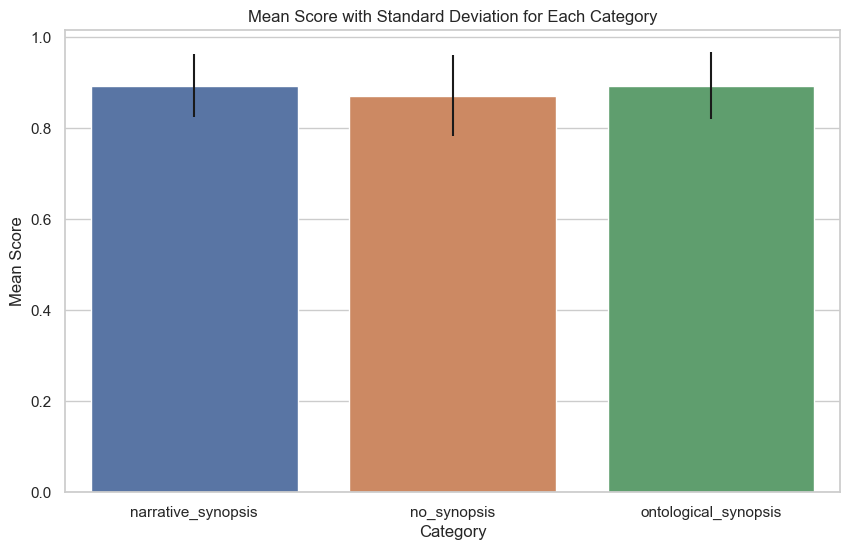

In [74]:
stats_df = result.groupby(METHOD).agg({'sim': [np.mean, np.std]}).reset_index()
stats_df.columns = ['category', 'mean', 'stddev']

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot with error bars
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(x='category', y='mean', data=stats_df, yerr=stats_df['stddev'], capsize=.1)

# Add labels and title
plt.xlabel("Category")
plt.ylabel("Mean Score")
plt.title("Mean Score with Standard Deviation for Each Category")

# Show the plot
plt.show()


In [75]:
diff_summary = result.groupby([MODEL, METHOD])['length_diff'].describe()[['count', 'mean', 'std', 'min', 'max']]
diff_summary.style.highlight_max(axis=0, props='font-weight:bold').format(precision=3)

## Potential Hallucinations

Summarize all GO terms that are in all summaries that are not in the closure of annotated terms for any of the genes in the gene set

In [76]:
def hallucinatons(df, model):
    novel_term_map = defaultdict(dict)
    for _, row in df.iterrows():
        gs = row[GENESET]
        #if not gs.endswith("-0"):
        #    continue
        gs = gs.replace("-0", "")
        for lbl in row[NOVEL_LABELS]:
            if row[MODEL] != model:
                continue
            m = row[METHOD]
            novel_term_map[lbl]["NAME"] = lbl
            if gs not in novel_term_map[lbl]:
                novel_term_map[lbl][m] = []
            novel_term_map[lbl][m].append(gs)
    novel_df = pd.DataFrame(novel_term_map.values())
    return novel_df

In [77]:
novel_df_turbo = hallucinatons(df, TURBO).reset_index(drop=True)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
novel_df_turbo

,NAME,narrative_synopsis,no_synopsis,ontological_synopsis
0,regulation of collagen metabolic process,[EDS],NaN,NaN
1,post-translational protein modification,[EDS],NaN,NaN
2,protein folding,[EDS-1],NaN,NaN
3,positive regulation of fatty acid beta-oxidation,NaN,[HALLMARK_ADIPOGENESIS],NaN
4,obsolete electron transport,[HALLMARK_FATTY_ACID_METABOLISM],NaN,[HALLMARK_OXIDATIVE_PHOSPHORYLATION-1]
5,cell growth,[HALLMARK_ADIPOGENESIS-1],NaN,NaN
6,"obsolete transcription factor activity, protein binding",[tf-downreg-colorectal],[tf-downreg-colorectal-1],[tf-downreg-colorectal-1]
7,interleukin-2 production,[HALLMARK_ALLOGRAFT_REJECTION],NaN,NaN
8,type II interferon production,[HALLMARK_ALLOGRAFT_REJECTION],NaN,NaN
9,regulation of protein stability,NaN,[HALLMARK_ANDROGEN_RESPONSE],NaN


In [78]:
hallucinatons(df, DAVINCI)

,NAME,narrative_synopsis,ontological_synopsis,no_synopsis
0,obsolete Gly-X carboxypeptidase activity,[EDS-1],NaN,NaN
1,phosphorylation,[FA],NaN,NaN
2,Holliday junction resolvase complex,NaN,[FA-1],NaN
3,double-stranded telomeric DNA binding,NaN,[FA-1],NaN
4,histone acetylation,NaN,[FA-1],NaN
5,protein tag,NaN,[FA-1],NaN
6,cysteine-type endopeptidase inhibitor activity,NaN,[HALLMARK_TGF_BETA_SIGNALING-1],NaN
7,obsolete electron transport,[HALLMARK_OXIDATIVE_PHOSPHORYLATION-1],[HALLMARK_OXIDATIVE_PHOSPHORYLATION],NaN
8,cytosolic transport,[HALLMARK_ADIPOGENESIS],NaN,NaN
9,endopeptidase activity,NaN,[HALLMARK_ADIPOGENESIS-1],NaN


In [79]:
import tiktoken
enc = tiktoken.encoding_for_model("gpt-4")
enc.encode("negative regulation")

def tok_similarity(t1, t2):
    if t1 is None and t2 is None:
        return 1
    if t1 is None or t2 is None:
        return 0

    toks1 = set(enc.encode(t1))
    toks2 = set(enc.encode(t2))
    return len(toks1.intersection(toks2)) / len(toks1.union(toks2))


In [84]:
closure_by_gene_set = {}
for comp in comps:
    closure = comp.payloads["closure"].term_strings
    closure_by_gene_set[comp.name] = closure

def hallucinatons_with_best_match(df, model):
    novel_term_map = defaultdict(dict)
    for _, row in df.iterrows():
        gs = row[GENESET]
        # print(gs)
        closure = closure_by_gene_set[gs]
        #if not gs.endswith("-0"):
        #    continue
        gs = gs.replace("-0", "")
        for lbl in row[NOVEL_LABELS]:
            if row[MODEL] != model:
                continue
            m = row[METHOD]
            novel_term_map[lbl]["NAME"] = lbl
            if gs not in novel_term_map[lbl]:
                novel_term_map[lbl][m] = []
            # sims = [(ct, text_similarity(ct, lbl)) for ct in closure]
            sims = [(ct, tok_similarity(ct, lbl)) for ct in closure]
            sims = sorted(sims, key=lambda x: -x[1])
            best = sims[0][0]
            novel_term_map[lbl][m].append((gs, best))
    novel_df = pd.DataFrame(novel_term_map.values())
    return novel_df

novel_df_turbo = hallucinatons_with_best_match(df, TURBO).reset_index(drop=True)
novel_df_turbo

,NAME,narrative_synopsis,no_synopsis,ontological_synopsis
0,regulation of collagen metabolic process,"[(EDS, regulation of metabolic process)]",NaN,NaN
1,post-translational protein modification,"[(EDS, regulation of protein modification process)]",NaN,NaN
2,protein folding,"[(EDS-1, protein processing)]",NaN,NaN
3,positive regulation of fatty acid beta-oxidation,NaN,"[(HALLMARK_ADIPOGENESIS, very long-chain fatty acid beta-oxidation)]",NaN
4,obsolete electron transport,"[(HALLMARK_FATTY_ACID_METABOLISM, respiratory electron transport chain)]",NaN,"[(HALLMARK_OXIDATIVE_PHOSPHORYLATION-1, respiratory electron transport chain)]"
5,cell growth,"[(HALLMARK_ADIPOGENESIS-1, cell)]",NaN,NaN
6,"obsolete transcription factor activity, protein binding","[(tf-downreg-colorectal, DNA-binding transcription factor binding)]","[(tf-downreg-colorectal-1, DNA-binding transcription factor binding)]","[(tf-downreg-colorectal-1, DNA-binding transcription factor binding)]"
7,interleukin-2 production,"[(HALLMARK_ALLOGRAFT_REJECTION, interleukin-2 binding)]",NaN,NaN
8,type II interferon production,"[(HALLMARK_ALLOGRAFT_REJECTION, type III interferon production)]",NaN,NaN
9,regulation of protein stability,NaN,"[(HALLMARK_ANDROGEN_RESPONSE, regulation of mRNA stability)]",NaN


## New Annotations

In [85]:
endocytosis = df.query(f"{GENESET} == 'endocytosis-0'").sort_values("similarity", ascending=False)
terms_summary(endocytosis)

,id,label,redundant,standard,standard no ontology,turbo ontological synopsis,dav narrative synopsis,dav ontological synopsis,turbo no synopsis,turbo narrative synopsis,dav no synopsis,rank based
0,GO:0006907,pinocytosis,False,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0006897,endocytosis,True,1.0,6.0,0.0,0.0,5.0,0.0,0.0,NaN,NaN
2,GO:0044351,macropinocytosis,True,2.0,0.0,NaN,4.0,NaN,NaN,NaN,NaN,NaN
3,GO:0016192,vesicle-mediated transport,True,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
4,GO:0030100,regulation of endocytosis,False,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GO:0006810,transport,True,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,GO:0051234,establishment of localization,True,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0045807,positive regulation of endocytosis,True,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,GO:0060627,regulation of vesicle-mediated transport,True,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0051179,localization,True,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [86]:
viz('endocytosis-0')

![img](output/endocytosis-0-True-v1.png)

### New Annotations

in 2022-03-24, GO `molecular sequesting` only had 6 genes annotated; this increased to 30 in 2023.
If these are past the LLM training date then we would not expect these to influence results. Additionally,


In [87]:
sequestering = df.query(f"{GENESET} == 'molecular sequestering-0'").sort_values("similarity", ascending=False)
sequestering[eval_summary_cols]                                                           

,has top term,in top 5,in top 10,size overlap,similarity,num terms,num GO terms,nr size overlap,nr similarity,mean p value,min p value,max p value,proportion significant,num unannotated
2188,True,True,True,26,1.00,26,26,10,1.00e+00,0.02,1.83e-93,0.05,1.00,0
2189,True,True,True,9,0.28,15,15,2,1.05e-01,0.41,1.83e-93,1.00,0.60,0
2179,True,True,True,2,0.07,6,4,1,8.33e-02,0.50,1.83e-93,1.00,0.50,0
2178,False,False,False,1,0.04,8,3,0,0.00e+00,0.67,1.97e-03,1.00,0.33,0
2184,True,False,True,1,0.03,19,6,0,0.00e+00,0.83,1.83e-93,1.00,0.17,1
2185,False,False,False,1,0.03,10,6,0,0.00e+00,0.83,2.83e-38,1.00,0.17,0
2176,False,False,False,1,0.03,8,8,1,6.25e-02,0.88,4.66e-04,1.00,0.12,0
2191,False,False,False,1,0.02,30,30,0,0.00e+00,0.97,4.71e-02,1.00,0.03,1
2192,True,False,False,26,0.01,2570,2526,1,3.23e-03,0.99,1.83e-93,1.00,0.01,0
2183,False,False,False,0,0.00,6,2,0,0.00e+00,1.00,1.00e+00,1.00,0.00,1


In [88]:
terms_summary(sequestering)

,id,label,redundant,standard,standard no ontology,dav ontological synopsis,turbo no synopsis,turbo ontological synopsis,rank based,dav no synopsis,dav narrative synopsis,turbo narrative synopsis
0,GO:0140313,molecular sequestering activity,False,0.0,1.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0140311,protein sequestering activity,True,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GO:0140487,metal ion sequestering activity,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GO:0048519,negative regulation of biological process,False,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GO:0006950,response to stress,False,4.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
5,GO:0048523,negative regulation of cellular process,True,5.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
6,GO:0140678,molecular function inhibitor activity,False,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0048585,negative regulation of response to stimulus,True,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,GO:0036316,SREBP-SCAP complex retention in endoplasmic reticulum,True,8.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0140315,iron ion sequestering activity,True,9.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
viz('molecular sequestering-0')

![img](output/molecular_sequestering-0-True-v1.png)

## IGRB

This gene set contains genes previously annotated to IGRB, many of which have been since removed

In [90]:
igrb = df.query(f"{GENESET} == 'ig-receptor-binding-2022-0'").sort_values("similarity", ascending=False)
terms_summary(igrb)

,id,label,redundant,standard,standard no ontology,rank based,dav narrative synopsis,turbo ontological synopsis,turbo narrative synopsis,dav no synopsis,dav ontological synopsis,turbo no synopsis
0,GO:0019814,immunoglobulin complex,False,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GO:0009897,external side of plasma membrane,False,1.0,0.0,89.0,NaN,NaN,NaN,NaN,NaN,NaN
2,GO:0098552,side of membrane,True,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GO:0002250,adaptive immune response,False,3.0,1.0,16.0,3.0,NaN,NaN,NaN,NaN,NaN
4,GO:0009986,cell surface,True,4.0,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN
5,GO:0006955,immune response,True,5.0,6.0,52.0,NaN,NaN,NaN,NaN,NaN,NaN
6,GO:0002376,immune system process,True,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GO:0005886,plasma membrane,True,7.0,NaN,64.0,NaN,NaN,NaN,NaN,NaN,NaN
8,GO:0071944,cell periphery,True,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GO:0003823,antigen binding,False,9.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [91]:
viz('ig-receptor-binding-2022-0')

![img](output/ig-receptor-binding-2022-0-True-v1.png)

In [96]:
viz('HALLMARK_GLYCOLYSIS-0')

![img](output/HALLMARK_GLYCOLYSIS-0-True-v1.png)

In [98]:
viz('HALLMARK_KRAS_SIGNALING_UP-0')

![img](output/HALLMARK_KRAS_SIGNALING_UP-0-True-v1.png)

## Summaries

In [92]:
objs = []
for c in comps:
    for m, payload in c.payloads.items():
        if payload.summary:
            objs.append({"model": c.model, "geneset": c.name, "method": m, "summary": payload.summary})

In [93]:
sdf = pd.DataFrame(objs)

In [ ]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
sdf

In [95]:
sdf.query("geneset == 'sensory ataxia-0'")

,model,geneset,method,summary
1680,None,sensory ataxia-0,gpt-3.5-turbo.no_synopsis.v1,"Summary: The enriched terms found among the listed human genes suggest a common involvement in cellular metabolism, particularly in mitochondrial function, protein folding and degradation, and transportation across cellular membranes.\nMechanism: These genes may be involved in the maintenance of cellular homeostasis and energy production.\n\nHypothesis: Many of the enriched terms are related to cellular stress pathways, suggesting that these genes may be involved in the response to stress and cellular damage. Additionally, the involvement of several genes related to mitochondrial function suggests that there may be a common underlying mechanism related to energy production and metabolism."
1681,None,sensory ataxia-0,gpt-3.5-turbo.no_synopsis.v2,"Summary: Genes are involved in nervous system development and function. \nMechanism: Myelination and axonal transport. \n\nHypothesis: The genes on the list are enriched for terms involved in nervous system development and function, including myelination, axon guidance, and neuron projection development. This suggests a role for these genes in the regulation of myelination and axonal transport, which are important processes for proper nervous system function. Dysfunction of these processes, due to mutations in genes such as PMP22 and SH3TC2, can lead to peripheral neuropathy and other neurological disorders."
1682,None,sensory ataxia-0,gpt-3.5-turbo.ontological_synopsis.v1,"Summary: Genes are primarily involved in the peripheral nervous system, myelination, and neurological disorders.\nMechanism: The enriched terms suggest that these genes primarily function in the peripheral nervous system and myelination.\n\nHypothesis: These genes are all involved in the development and maintenance of the peripheral nervous system and myelination. Dysregulation or mutation of these genes likely leads to neuropathic disorders."
1683,None,sensory ataxia-0,gpt-3.5-turbo.ontological_synopsis.v2,"Summary: Genes are involved in various processes in the development and maintenance of the nervous system, specifically peripheral nerves and myelination, as well as nucleic acid and protein metabolism.\n\nMechanism: The enriched terms suggest a common underlying biological mechanism in the formation and maintenance of the peripheral nervous system and myelination, as well as in nucleic acid and protein metabolism.\n\n\nHypothesis: The enrichment of terms related to Charcot-Marie-Tooth disease and myelination suggest that these genes play an important role in peripheral nervous system development and maintenance, specifically in the formation and maintenance of myelin. The enrichment of terms related to protein folding and nucleic acid metabolism suggest that these genes also have a role in maintaining and regulating the overall metabolic processes of cells. The involvement of genes in mitochondrial function suggests a possible link between peripheral nerve function and mitochondrial metabolism."
1684,None,sensory ataxia-0,gpt-3.5-turbo.narrative_synopsis.v1,"Summary: Myelin upkeep and neurological diseases\n\nHypothesis: Dysregulation of the myelin upkeep pathways can lead to mitochondrial dysfunction, accumulations of toxic metabolites, and impaired protein processing, which contribute to the development of neurological diseases. Dysfunction of the transporter proteins and nuclear membrane transporters can further exacerbate cell dysfunction and death. Treatment strategies aimed at restoring mitochondrial function and enhancing myelin synthesis and repair may alleviate symptoms of these diseases."
1685,None,sensory ataxia-0,gpt-3.5-turbo.narrative_synopsis.v2,"Summary: Peripheral nervous system myelination and neurodegenerative diseases are enriched in this set of genes. \nMechanism: Maintenance of peripheral nervous system myelin structure and function through regulation of protein import, DNA replication, and degradation p